# This cat does not exist

Цель этого задания - создать котов, которых не существует. В ходе данного задания вы обучите DCGAN и VAE, которые являются одними из первых генеративных моделей. Для этого задания вам наверняка потребуется GPU с CUDA, поэтому рекомендуется использовать Google Colab.

In [1]:
import torch
from torch import nn
from torch.optim import Adam, SGD
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import os 
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import random
import numpy as np
from copy import deepcopy

%matplotlib inline

In [2]:
torch.cuda.empty_cache()

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

#from google.colab import files
#uploaded = files.upload()

Mounted at /content/drive


In [4]:
#!unzip "/content/cat_136.zip" -d "/content/data"

In [5]:
def random_noise(batch_size, channels, side_size):
    return torch.randn(batch_size, channels, side_size, side_size).cuda()

def imagewide_average(x):
    return x.mean(dim=(-1, -2))

In [6]:
def visualise(imgs, rows=2):
    imgs = (imgs.transpose(1, 3) + 1) / 2
    imgs = torch.cat([imgs[i::rows] for i in range(rows)], dim=1)
    cols = len(imgs)
    imgs = (torch.cat(list(imgs), dim=1)).cpu().numpy()[:, :, ::-1]
    plt.figure(figsize=(cols*1.5, rows*1.5))
    plt.imshow(imgs)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [7]:
class CatDataset(Dataset):
    #/content/drive/MyDrive/hw6/cat_136
    def __init__(self, path_to_dataset="/content/drive/MyDrive/hw6/cat_136", size=64):
        self.photo_names = os.listdir(path_to_dataset)
        self.path_base = path_to_dataset
        self.size = size
    
    def __getitem__(self, index):
        path = self.path_base + "/" + self.photo_names[index]
        img = cv2.imread(path) # 136 x 136
        crop_rate = 8
        x_crop = random.randint(0, crop_rate)
        y_crop = random.randint(0, crop_rate)
        img = img[x_crop:136 - crop_rate + x_crop, y_crop:136 - crop_rate + y_crop]
        img = cv2.resize(img, (self.size, self.size), interpolation=cv2.INTER_CUBIC)
        return 2 * torch.tensor(img).float().transpose(0, 2) / 255. - 1
    
    def __len__(self):
        return len(self.photo_names)

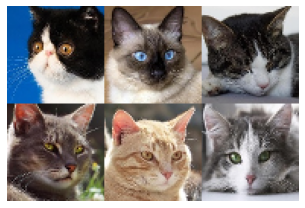

In [8]:
dataset = CatDataset()
visualise(torch.cat([dataset[i].unsqueeze(0) for i in [3, 15, 182, 592, 394, 2941]], dim=0))

### Задание 1 (2 балла)
Для начала реализуем генератор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](hw06/imgs/DCGAN.png)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ConvTranspose2D`, `nn.ReLU`, а также функция `F.interpolate`.

#### Методы
* `__init__` - принимает на вход `start_size`, `latent_channels`, `start_channels` и `upsamplings`. Первые два аргумента отвечают за размер случайного шума, из которого в последствии будет сгенерирована картинка. `start_channels` отвечает за то, сколько каналов должно быть в картинке перед тем, как к ней будут применены upsampling блоки. `upsamplings` - это количество upsampling блоков, которые должны быть применены к картинке. В каждом таком локе количество каналов уменьшается в два раза.


* `forward` - принимает на вход `batch_size`, генерирует `batch_size` картинок из случайного шума.

In [ ]:
class Generator(nn.Module):
    def __init__(self, start_size=2, latent_channels=32, start_channels=1024, upsamplings=6):
        super().__init__()

        self.latent_channels = latent_channels
        self.start_size = start_size

        channels = start_channels

        self.conv1 = nn.Conv2d(in_channels=latent_channels, out_channels=start_channels, kernel_size=1)
        
        upsample_modules = []
        for _ in range(upsamplings):
            upsample_modules.append(nn.ConvTranspose2d(in_channels=channels, out_channels=channels // 2, kernel_size=4, stride=2, padding=1))
            upsample_modules.append(nn.BatchNorm2d(channels // 2))
            upsample_modules.append(nn.LeakyReLU())
            
            channels //= 2

        self.upsample_block = nn.Sequential(*upsample_modules)
        self.conv2 = nn.Conv2d(in_channels=channels, out_channels=3, kernel_size=1)  
    
    def forward(self, batch_size: int):
        noise = random_noise(batch_size, self.latent_channels, self.start_size)

        generated = self.conv1(noise)
        generated = self.upsample_block(generated)
        generated = self.conv2(generated)
        generated = torch.tanh(generated)
        return generated # torch.Tensor batch_size x 3 x (start_size * 2**upsamplings) x (start_size * 2**upsamplings)

### Задание 2 (2 балла)
Для начала реализуем дискриминатор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](hw06/imgs/Disc_DCGAN.png)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ReLU` и `nn.Sigmoid`.

#### Методы
* `__init__` - принимает на вход `start_channels` и `downsamplings`. `start_channels` определяет количество каналов, которые должны быть в изображении перед применением downsampling блоков.


* `forward` - принимает на вход `x` - тензор с картинками. Возвращает вектор с размерностью `batch_size`.

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, image_size, downsamplings=6, start_channels=8):
        super().__init__()

        channels = start_channels

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=channels, kernel_size=1)
        
        downsample_modules = []
        for _ in range(downsamplings):
            downsample_modules.append(nn.Conv2d(in_channels=channels, out_channels=channels * 2, kernel_size=3, stride=2, padding=1))
            downsample_modules.append(nn.BatchNorm2d(channels * 2))
            downsample_modules.append(nn.LeakyReLU())

            channels *= 2

        self.downsample_block = nn.Sequential(*downsample_modules)
        self.fc1 = nn.Linear(start_channels * (image_size ** 2) // (2 ** downsamplings), 1)   
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.downsample_block(x)

        x = nn.Flatten()(x)
        x = self.fc1(x)
        x = torch.sigmoid(x)
        return x # torch.Tensor batch_size x 1

In [ ]:
def train_gan():
    generator = Generator()
    discriminator = Discriminator(128)

    epochs = 120
    visualise_every = 10
    batch_size = 8
    generator.cuda()
    discriminator.cuda()

    gen_optim = Adam(generator.parameters(), lr=1e-4, betas=(0.5, 0.999))
    disc_optim = Adam(discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999))

    dataset = CatDataset(size=128)

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        gen_loss_avg = 0
        disc_loss_avg = 0

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            # Positive update
            batch = batch.cuda()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Negative update
            batch = generator(batch_size).detach()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.zeros_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Generator update
            batch = generator(batch_size)
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            gen_optim.zero_grad()
            loss.backward()
            gen_optim.step()
            gen_loss_avg += loss.item()
            
        if (ep + 1) % visualise_every == 0:
            with torch.no_grad():
                visualise(generator(6), rows=2)

        print(f"Epoch {ep+1} | Discriminator loss: {disc_loss_avg / total_batches} | Generator loss: {gen_loss_avg / total_batches}")

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 1 | Discriminator loss: 0.6986784358531446 | Generator loss: 2.9145115595455318


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 2 | Discriminator loss: 1.0290428990368232 | Generator loss: 1.7063558601593787


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 3 | Discriminator loss: 0.9539191643628039 | Generator loss: 1.8989147841468337


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 4 | Discriminator loss: 0.9408701204225537 | Generator loss: 2.02456712926081


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 5 | Discriminator loss: 1.0005388155233028 | Generator loss: 1.7288369916206183


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 6 | Discriminator loss: 1.027480188451072 | Generator loss: 1.7170798935631448


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 7 | Discriminator loss: 0.9543504208557365 | Generator loss: 1.7565566885378934


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 8 | Discriminator loss: 0.935255691328252 | Generator loss: 1.793687602808309


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 9 | Discriminator loss: 0.9023730356910432 | Generator loss: 1.8662655726883763


  0%|          | 0/646 [00:00<?, ?it/s]

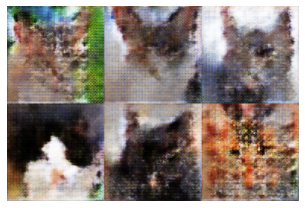

Epoch 10 | Discriminator loss: 0.8658582143139008 | Generator loss: 1.9483578246693278


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 11 | Discriminator loss: 0.8238582480150137 | Generator loss: 2.03522903309312


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 12 | Discriminator loss: 0.7499887523436269 | Generator loss: 2.156877217089483


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 13 | Discriminator loss: 0.7371648864863917 | Generator loss: 2.1946889549262765


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 14 | Discriminator loss: 0.6829132277431876 | Generator loss: 2.3819581009620845


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 15 | Discriminator loss: 0.660207559813045 | Generator loss: 2.47246499532877


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 16 | Discriminator loss: 0.6320869906697162 | Generator loss: 2.5273704483527544


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 17 | Discriminator loss: 0.5908555278576217 | Generator loss: 2.7258855609930763


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 18 | Discriminator loss: 0.5660855939221937 | Generator loss: 2.7420346038286074


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 19 | Discriminator loss: 0.5352868759389172 | Generator loss: 2.8976703511652095


  0%|          | 0/646 [00:00<?, ?it/s]

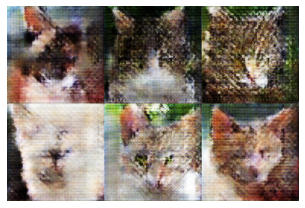

Epoch 20 | Discriminator loss: 0.5306163841501138 | Generator loss: 2.943520427212235


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 21 | Discriminator loss: 0.4918002626905579 | Generator loss: 3.119364154338837


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 22 | Discriminator loss: 0.4889012301402968 | Generator loss: 3.1309824077426924


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 23 | Discriminator loss: 0.45677799062853924 | Generator loss: 3.1543218106262443


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 24 | Discriminator loss: 0.4253332661791495 | Generator loss: 3.3109874507253485


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 25 | Discriminator loss: 0.43806906508436594 | Generator loss: 3.456771836909213


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 26 | Discriminator loss: 0.4320873859408853 | Generator loss: 3.4198458054269008


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 27 | Discriminator loss: 0.4476686493100151 | Generator loss: 3.2915052112682845


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 28 | Discriminator loss: 0.4179995051617626 | Generator loss: 3.4720176746678906


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 29 | Discriminator loss: 0.3906670847362586 | Generator loss: 3.573353518765102


  0%|          | 0/646 [00:00<?, ?it/s]

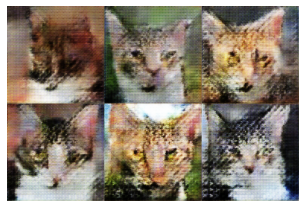

Epoch 30 | Discriminator loss: 0.41025210584341476 | Generator loss: 3.4685737266096957


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 31 | Discriminator loss: 0.40811389379014706 | Generator loss: 3.463342605265536


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 32 | Discriminator loss: 0.3730565582153427 | Generator loss: 3.639012309192687


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 33 | Discriminator loss: 0.380665017067161 | Generator loss: 3.6293864440548327


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 34 | Discriminator loss: 0.3456894308415179 | Generator loss: 3.7581532277802165


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 35 | Discriminator loss: 0.3740700702707043 | Generator loss: 3.6529491273931756


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 36 | Discriminator loss: 0.37385898923840694 | Generator loss: 3.8322879589343257


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 37 | Discriminator loss: 0.3750899403522517 | Generator loss: 3.7184372190357178


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 38 | Discriminator loss: 0.36383254855198655 | Generator loss: 3.7686776310898535


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 39 | Discriminator loss: 0.33590411803408304 | Generator loss: 3.941742837844893


  0%|          | 0/646 [00:00<?, ?it/s]

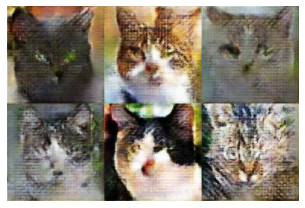

Epoch 40 | Discriminator loss: 0.3659705589380785 | Generator loss: 3.8307379343712977


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 41 | Discriminator loss: 0.34932005180130793 | Generator loss: 3.8326210162436314


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 42 | Discriminator loss: 0.33529843829070555 | Generator loss: 3.828736638375955


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 43 | Discriminator loss: 0.3306996900233557 | Generator loss: 4.005586721638377


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 44 | Discriminator loss: 0.33479937677819166 | Generator loss: 4.001697720206061


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 45 | Discriminator loss: 0.34262877523712904 | Generator loss: 3.9978881589201993


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 46 | Discriminator loss: 0.3076312847674735 | Generator loss: 3.9583218308382255


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 47 | Discriminator loss: 0.3140407605596088 | Generator loss: 4.1538837789565095


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 48 | Discriminator loss: 0.3081942412301984 | Generator loss: 4.124128316724023


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 49 | Discriminator loss: 0.314509328227692 | Generator loss: 3.9964113707690276


  0%|          | 0/646 [00:00<?, ?it/s]

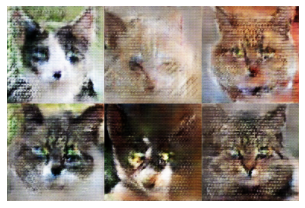

Epoch 50 | Discriminator loss: 0.3107927940441038 | Generator loss: 4.204237099858218


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 51 | Discriminator loss: 0.3102781777810223 | Generator loss: 4.053859693042992


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 52 | Discriminator loss: 0.2795049859935455 | Generator loss: 4.212866577344347


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 53 | Discriminator loss: 0.31185705140570963 | Generator loss: 4.316460739087689


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 54 | Discriminator loss: 0.28309146950534003 | Generator loss: 4.162204436137695


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 55 | Discriminator loss: 0.2548387387670323 | Generator loss: 4.527474933631661


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 56 | Discriminator loss: 0.28781844392106276 | Generator loss: 4.458525516450867


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 57 | Discriminator loss: 0.2693095368769542 | Generator loss: 4.413092536519664


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 58 | Discriminator loss: 0.28076377315203743 | Generator loss: 4.337707606027292


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 59 | Discriminator loss: 0.2545347291176345 | Generator loss: 4.418758057161819


  0%|          | 0/646 [00:00<?, ?it/s]

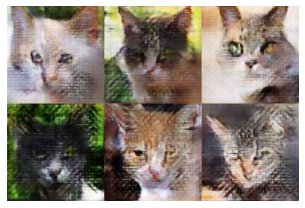

Epoch 60 | Discriminator loss: 0.27517105467304787 | Generator loss: 4.422959620915642


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 61 | Discriminator loss: 0.2770816974929664 | Generator loss: 4.452678316877794


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 62 | Discriminator loss: 0.27627569307509203 | Generator loss: 4.485183785359065


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 63 | Discriminator loss: 0.23673140696804934 | Generator loss: 4.461480010387509


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 64 | Discriminator loss: 0.24015961538417788 | Generator loss: 4.683965850061225


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 65 | Discriminator loss: 0.24912743938651802 | Generator loss: 4.481512290747591


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 66 | Discriminator loss: 0.25384288719354714 | Generator loss: 4.786914814719858


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 67 | Discriminator loss: 0.2123565515598132 | Generator loss: 4.73085926484692


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 68 | Discriminator loss: 0.24801047070986545 | Generator loss: 4.666293249573818


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 69 | Discriminator loss: 0.2350631713228539 | Generator loss: 4.552879751283069


  0%|          | 0/646 [00:00<?, ?it/s]

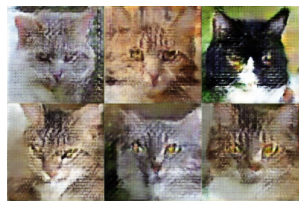

Epoch 70 | Discriminator loss: 0.24824415079171466 | Generator loss: 4.7321132556412575


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 71 | Discriminator loss: 0.25810463775659653 | Generator loss: 4.639165794017703


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 72 | Discriminator loss: 0.20693329308988306 | Generator loss: 4.773622718245484


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 73 | Discriminator loss: 0.22035672228720132 | Generator loss: 4.773875578152117


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 74 | Discriminator loss: 0.24552660230612638 | Generator loss: 4.857410706845365


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 75 | Discriminator loss: 0.21860892287585185 | Generator loss: 5.019119297533996


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 76 | Discriminator loss: 0.22841726454636968 | Generator loss: 4.74456086010896


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 77 | Discriminator loss: 0.20030008277768616 | Generator loss: 4.778370080992233


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 78 | Discriminator loss: 0.23029347836065175 | Generator loss: 4.986862239079882


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 79 | Discriminator loss: 0.21143967875369427 | Generator loss: 4.76069308380748


  0%|          | 0/646 [00:00<?, ?it/s]

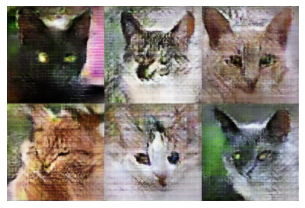

Epoch 80 | Discriminator loss: 0.20771455296982202 | Generator loss: 5.129921183290407


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 81 | Discriminator loss: 0.20176428529356602 | Generator loss: 5.134290225191634


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 82 | Discriminator loss: 0.21633477566158102 | Generator loss: 4.991250997273497


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 83 | Discriminator loss: 0.20309683619208255 | Generator loss: 5.117122540825097


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 84 | Discriminator loss: 0.22521884353775176 | Generator loss: 4.89692453192186


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 85 | Discriminator loss: 0.21232335800677427 | Generator loss: 5.073584317514139


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 86 | Discriminator loss: 0.1708829730369922 | Generator loss: 4.999973905548569


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 87 | Discriminator loss: 0.2040421111880847 | Generator loss: 5.117654734480289


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 88 | Discriminator loss: 0.19370026734341234 | Generator loss: 5.1431528991044955


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 89 | Discriminator loss: 0.19614462662552073 | Generator loss: 5.142676039074742


  0%|          | 0/646 [00:00<?, ?it/s]

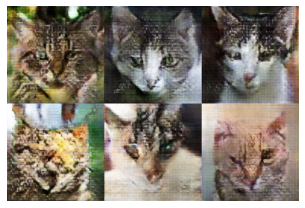

Epoch 90 | Discriminator loss: 0.1888865833240894 | Generator loss: 5.240568358861199


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 91 | Discriminator loss: 0.19040664386427517 | Generator loss: 5.4683502334956975


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 92 | Discriminator loss: 0.1925822363289592 | Generator loss: 5.277655341435772


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 93 | Discriminator loss: 0.20032120324042665 | Generator loss: 5.020370376202488


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 94 | Discriminator loss: 0.17609506134301445 | Generator loss: 5.280057714706244


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 95 | Discriminator loss: 0.18222977152888883 | Generator loss: 5.324063609182373


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 96 | Discriminator loss: 0.1835609261837921 | Generator loss: 5.29866301033848


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 97 | Discriminator loss: 0.19716504745590455 | Generator loss: 5.447314544426378


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 98 | Discriminator loss: 0.16661300710423263 | Generator loss: 5.267688770257226


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 99 | Discriminator loss: 0.17474372263958765 | Generator loss: 5.260166112027427


  0%|          | 0/646 [00:00<?, ?it/s]

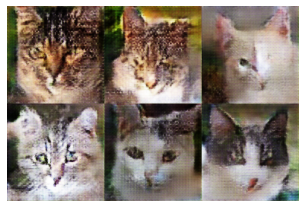

Epoch 100 | Discriminator loss: 0.18466240456076347 | Generator loss: 5.356131165803865


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 101 | Discriminator loss: 0.17057987402785965 | Generator loss: 5.619812880005948


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 102 | Discriminator loss: 0.1825525663639322 | Generator loss: 5.558822042812673


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 103 | Discriminator loss: 0.180192717181733 | Generator loss: 5.509867966821951


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 104 | Discriminator loss: 0.16772662301736607 | Generator loss: 5.39048349469207


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 105 | Discriminator loss: 0.16150217219766486 | Generator loss: 5.537090053854063


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 106 | Discriminator loss: 0.15780693080933753 | Generator loss: 5.5316409739413


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 107 | Discriminator loss: 0.17978034548294758 | Generator loss: 5.553525382927222


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 108 | Discriminator loss: 0.18281835407922245 | Generator loss: 5.382474666418031


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 109 | Discriminator loss: 0.1654609347842317 | Generator loss: 5.407040992633317


  0%|          | 0/646 [00:00<?, ?it/s]

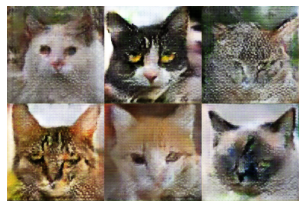

Epoch 110 | Discriminator loss: 0.17748625300088874 | Generator loss: 5.499075852623282


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 111 | Discriminator loss: 0.1725638149335377 | Generator loss: 5.530992250017418


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 112 | Discriminator loss: 0.15462773581106826 | Generator loss: 5.527155538122783


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 113 | Discriminator loss: 0.1559496340310111 | Generator loss: 5.503522245366444


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 114 | Discriminator loss: 0.17512928849949486 | Generator loss: 5.539550865620606


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 115 | Discriminator loss: 0.17195671373586294 | Generator loss: 5.491994800447493


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 116 | Discriminator loss: 0.15443896443334754 | Generator loss: 5.526618246329847


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 117 | Discriminator loss: 0.15577211316132394 | Generator loss: 5.659939275970754


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 118 | Discriminator loss: 0.15635659917464004 | Generator loss: 5.727214598655701


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 119 | Discriminator loss: 0.1603863837283695 | Generator loss: 5.807192397117615


  0%|          | 0/646 [00:00<?, ?it/s]

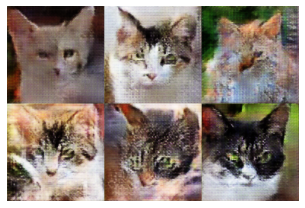

Epoch 120 | Discriminator loss: 0.14086979028978736 | Generator loss: 5.70533657489821


In [ ]:
train_gan()

### Задание 3 (5 баллов)
Теперь посмотрим на другую модель: Variational Autoencoder. В отличии от GAN, в котором генератор пытается себя обмануть дискриминатор, а дискриминатор старается не быть обманутым, VAE решает задачу реконструкции элемента множества X с применением регуляризации в латентном пространстве. 

Полностью архитектура выглядит так:
![](imgs/VAE.png)

Из нее можно выделить две части: Encoder (по изображению возвращает mu и sigma) и Decoder (по случайному шуму восстанавливает изображение). На высоком уровне VAE можно представить так:

![](imgs/VAE_highlevel.png)

В данном задании вам необходимо реализовать полную архитектуру VAE.

#### Методы
* `__init__` - принимает на вход `img_size`, `downsamplings`, `latent_size`, `linear_hidden_size`, `down_channels` и `up_channels`. `img_size` - размер стороны входного изображения. `downsamplings` - количество downsampling (и upsampling) блоков. `latent_size` - размер латентного пространства, в котором в который будет закодирована картинка. `linear_hidden_size` количество нейронов на скрытом слое полносвязной сети в конце encoder'а. Для полносвязной сети decoder'а это число стоит умножить на 2. `down_channels` - количество каналов, в которое будет преобразовано трехцветное изображение перед применением `downsampling` блоков. `up_channels` - количество каналов, которое должно получиться после применения всех upsampling блоков.

* `forward` - принимает на вход `x`. Считает распределение $N(\mu, \sigma^2)$ и вектор $z \sim N(\mu, \sigma^2)$. Возвращает $x'$ - восстановленную из вектора $z$ картинку и $D_{KL}(N(\mu, \sigma^2), N(0, 1)) = 0.5 \cdot (\sigma^2 + \mu^2 - \log \sigma^2 - 1)$.

* `encode` - принимает на вход `x`. Возвращает вектор из распределения $N(\mu, \sigma^2)$.

* `decode` - принимает на вход `z`. Возвращает восстановленную по вектору картинку.


#### Если хочется улучшить качество
https://arxiv.org/pdf/1906.00446.pdf

In [9]:
class VAE(nn.Module):
    def __init__(self, downsamplings=7, latent_size=512, down_channels=8, up_channels=16):
        super().__init__()
        
        self.latent_size = latent_size

        channels = down_channels
        
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=channels, kernel_size=1)
        
        downsample_modules = []
        for _ in range(downsamplings):
            downsample_modules.append(nn.Conv2d(in_channels=channels, out_channels=channels * 2, kernel_size=3, stride=2, padding=1))
            downsample_modules.append(nn.BatchNorm2d(channels * 2))
            downsample_modules.append(nn.ReLU())

            channels *= 2
        self.downsample_block = nn.Sequential(*downsample_modules)
            
        self.conv2 = nn.Conv2d(in_channels=channels, out_channels=2 * latent_size, kernel_size=1)

        self.conv3 = nn.Conv2d(in_channels=latent_size, out_channels=channels, kernel_size=1)

        upsample_modules = []
        for _ in range(downsamplings):
            upsample_modules.append(nn.ConvTranspose2d(in_channels=channels, out_channels=channels // 2, kernel_size=4, stride=2, padding=1))
            upsample_modules.append(nn.BatchNorm2d(channels // 2))
            upsample_modules.append(nn.ReLU())
            
            channels //= 2
        self.upsample_block = nn.Sequential(*upsample_modules)
            
        self.conv4 = nn.Conv2d(in_channels=channels, out_channels=3, kernel_size=1)

    def forward(self, x):
        embedding = self.encode(x)
        
        image = self.decode(embedding)

        kld = 0.5 * ((self.mu ** 2) + (self.sigma ** 2) - (2 * torch.log(self.sigma) - 1))

        return image, kld
    
    def encode(self, x):
        x = self.conv1(x)
        x = self.downsample_block(x)
        x = self.conv2(x)

        self.mu, self.sigma = x[:,:self.latent_size, :, :], torch.exp(x[:, self.latent_size:, :, :])

        noise = random_noise(x.shape[0], self.latent_size, x.size()[2])

        return self.mu + noise * self.sigma
    
    def decode(self, z):
        z = self.conv3(z)
        z = self.upsample_block(z)     
        z = self.conv4(z)
        z = torch.tanh(z)

        return z

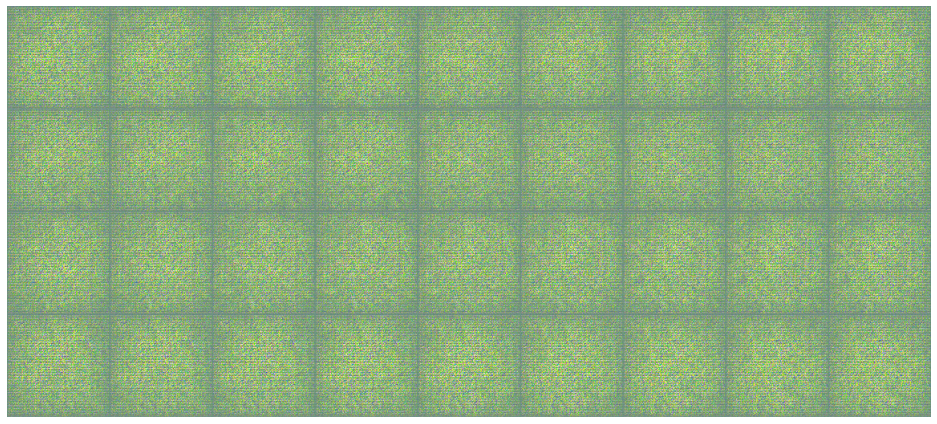

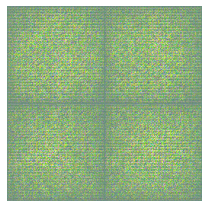

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 1 | Reconstruction loss: 11512.820828791182 | KLD loss: 759.7225979590601


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 2 | Reconstruction loss: 7568.736124485223 | KLD loss: 897.6591396597929


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 3 | Reconstruction loss: 6759.5789645409395 | KLD loss: 992.807014122305


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 4 | Reconstruction loss: 6270.104587572674 | KLD loss: 1059.1127122509388


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 5 | Reconstruction loss: 6009.170838253997 | KLD loss: 1098.5151378542878


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 6 | Reconstruction loss: 5840.703240824854 | KLD loss: 1122.3878128406614


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 7 | Reconstruction loss: 5656.862352001574 | KLD loss: 1141.9357824990916


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 8 | Reconstruction loss: 5530.9633016896805 | KLD loss: 1162.0965727576913


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 9 | Reconstruction loss: 5408.313518955911 | KLD loss: 1173.0351598458697


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 10 | Reconstruction loss: 5338.986525330063 | KLD loss: 1180.8004998258841


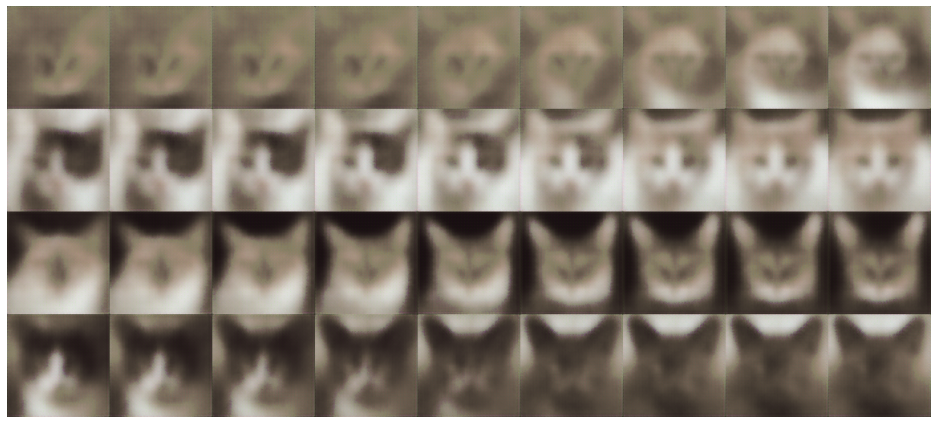

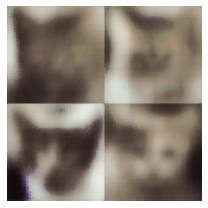

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 11 | Reconstruction loss: 5247.776448567708 | KLD loss: 1190.976065323704


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 12 | Reconstruction loss: 5149.876473171027 | KLD loss: 1206.1739874788034


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 13 | Reconstruction loss: 5037.58449309593 | KLD loss: 1219.6533871199733


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 14 | Reconstruction loss: 4955.070750439075 | KLD loss: 1223.5360448083213


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 15 | Reconstruction loss: 4874.42028638263 | KLD loss: 1226.0763524255087


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 16 | Reconstruction loss: 4777.358155432413 | KLD loss: 1229.6919036155523


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 17 | Reconstruction loss: 4712.1748978015985 | KLD loss: 1234.3219259099442


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 18 | Reconstruction loss: 4705.85862440952 | KLD loss: 1241.7520967705304


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 19 | Reconstruction loss: 4631.081853349079 | KLD loss: 1240.725011355378


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 20 | Reconstruction loss: 4589.400102576914 | KLD loss: 1245.71352614765


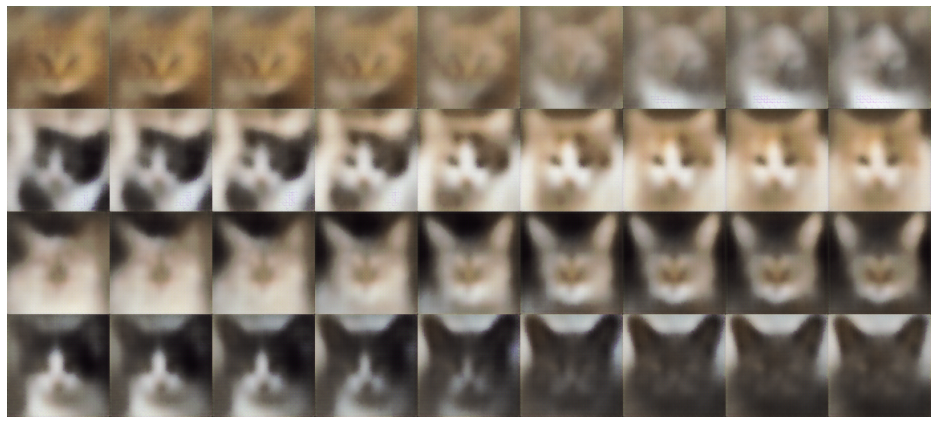

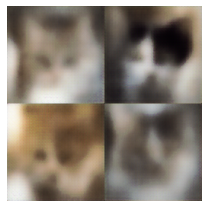

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 21 | Reconstruction loss: 4548.625141563712 | KLD loss: 1247.074889095809


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 22 | Reconstruction loss: 4505.455156477107 | KLD loss: 1258.2475860359132


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 23 | Reconstruction loss: 4457.345019909762 | KLD loss: 1252.8911596490432


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 24 | Reconstruction loss: 4431.314342599322 | KLD loss: 1255.1175342175388


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 25 | Reconstruction loss: 4384.750193419937 | KLD loss: 1266.4061370139898


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 26 | Reconstruction loss: 4316.781467266231 | KLD loss: 1269.148511688469


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 27 | Reconstruction loss: 4285.348292151163 | KLD loss: 1271.0783575959908


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 28 | Reconstruction loss: 4247.729599685077 | KLD loss: 1270.7312539743823


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 29 | Reconstruction loss: 4237.0541378997095 | KLD loss: 1272.3979630344597


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 30 | Reconstruction loss: 4205.386926931928 | KLD loss: 1284.3431905583818


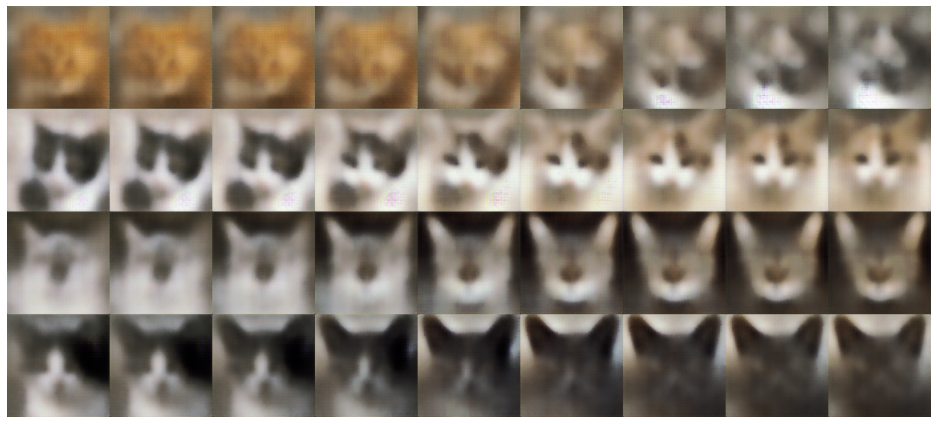

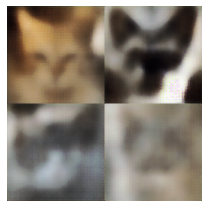

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 31 | Reconstruction loss: 4183.778096233043 | KLD loss: 1284.9585415152617


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 32 | Reconstruction loss: 4119.971968871124 | KLD loss: 1283.6903852122698


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 33 | Reconstruction loss: 4123.083128558018 | KLD loss: 1286.5418320766714


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 34 | Reconstruction loss: 4087.580632267442 | KLD loss: 1289.0420951429264


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 35 | Reconstruction loss: 4052.5075558684593 | KLD loss: 1289.336824544271


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 36 | Reconstruction loss: 4028.9625442859738 | KLD loss: 1287.1799999621487


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 37 | Reconstruction loss: 4023.1202894107314 | KLD loss: 1293.809257661095


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 38 | Reconstruction loss: 3992.4574267956637 | KLD loss: 1295.2681915046633


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 39 | Reconstruction loss: 3981.2079533066862 | KLD loss: 1293.0757223912913


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 40 | Reconstruction loss: 3943.564807034278 | KLD loss: 1295.8623396999153


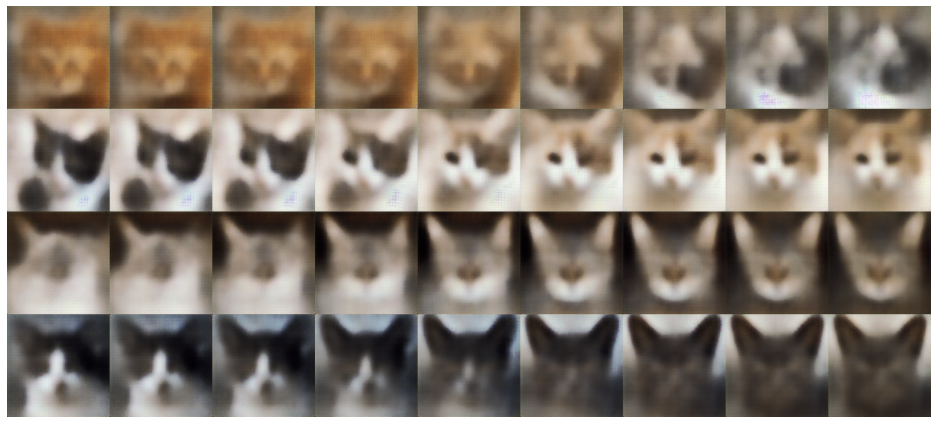

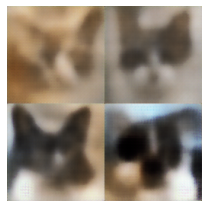

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 41 | Reconstruction loss: 3942.3314680232556 | KLD loss: 1292.5045934396196


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 42 | Reconstruction loss: 3912.3588795270107 | KLD loss: 1296.6486066951309


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 43 | Reconstruction loss: 3887.489354711725 | KLD loss: 1295.5671256131905


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 44 | Reconstruction loss: 3891.7664872516957 | KLD loss: 1297.2826124560925


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 45 | Reconstruction loss: 3866.4352573128635 | KLD loss: 1297.8083346581275


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 46 | Reconstruction loss: 3861.151184365916 | KLD loss: 1299.8432798873546


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 47 | Reconstruction loss: 3843.3087095748547 | KLD loss: 1293.085392820373


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 48 | Reconstruction loss: 3824.7167870336725 | KLD loss: 1299.1624146454094


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 49 | Reconstruction loss: 3806.061838359981 | KLD loss: 1296.2548565058746


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 50 | Reconstruction loss: 3778.933204260538 | KLD loss: 1295.7693060350048


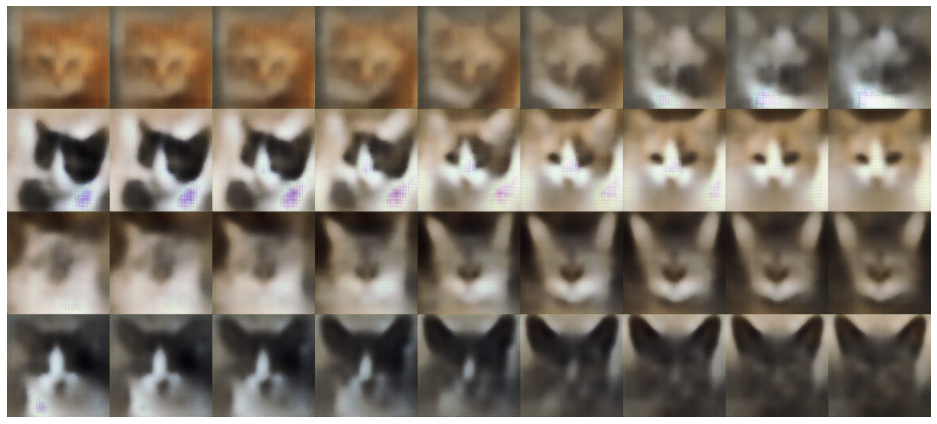

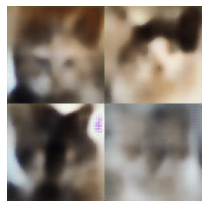

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 51 | Reconstruction loss: 3789.8371018047483 | KLD loss: 1295.5310446569163


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 52 | Reconstruction loss: 3797.0766961149466 | KLD loss: 1303.0458899209666


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 53 | Reconstruction loss: 3750.216739719598 | KLD loss: 1296.5989127225655


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 54 | Reconstruction loss: 3740.6465373667634 | KLD loss: 1296.3431733360587


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 55 | Reconstruction loss: 3734.205481619428 | KLD loss: 1300.8420951429264


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 56 | Reconstruction loss: 3721.3362440952037 | KLD loss: 1297.911934312924


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 57 | Reconstruction loss: 3701.504290061773 | KLD loss: 1297.457629867672


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 58 | Reconstruction loss: 3710.1348909126696 | KLD loss: 1301.2356755692829


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 59 | Reconstruction loss: 3694.1721036216086 | KLD loss: 1299.8537232391593


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 60 | Reconstruction loss: 3672.268018713663 | KLD loss: 1302.4152849064317


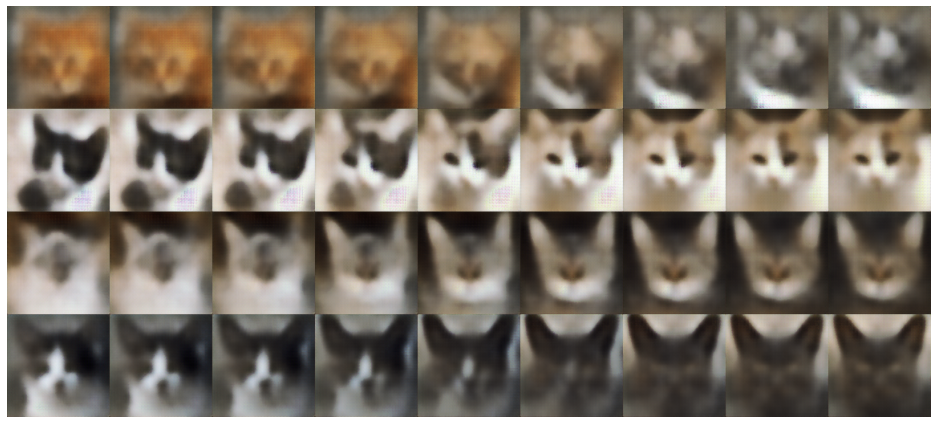

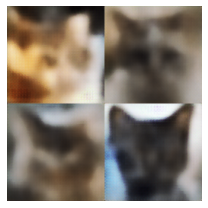

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 61 | Reconstruction loss: 3655.756299963663 | KLD loss: 1299.5891679157583


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 62 | Reconstruction loss: 3651.9516522074855 | KLD loss: 1297.8133083136506


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 63 | Reconstruction loss: 3648.628488372093 | KLD loss: 1297.1597678960757


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 64 | Reconstruction loss: 3631.8991880904796 | KLD loss: 1300.6087387203247


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 65 | Reconstruction loss: 3617.543175417878 | KLD loss: 1303.909574854651


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 66 | Reconstruction loss: 3618.2573529857073 | KLD loss: 1296.6455748092296


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 67 | Reconstruction loss: 3615.0091350230136 | KLD loss: 1295.8011444328367


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 68 | Reconstruction loss: 3593.374224427689 | KLD loss: 1296.7665143153465


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 69 | Reconstruction loss: 3583.8056981286336 | KLD loss: 1297.6557386294817


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 70 | Reconstruction loss: 3571.729838905039 | KLD loss: 1296.0946605120519


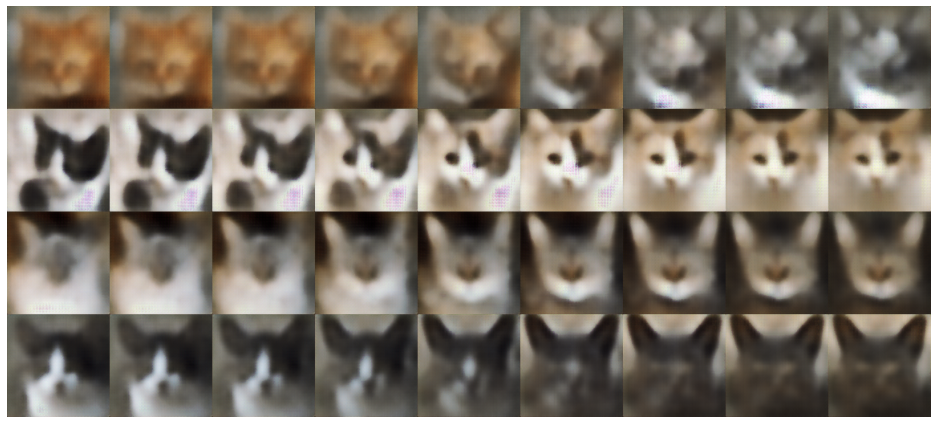

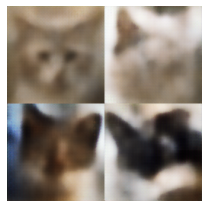

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 71 | Reconstruction loss: 3570.2803215085996 | KLD loss: 1299.4717268123184


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 72 | Reconstruction loss: 3561.312567753755 | KLD loss: 1299.5650515534157


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 73 | Reconstruction loss: 3551.452788880814 | KLD loss: 1293.4482442693193


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 74 | Reconstruction loss: 3555.694272725896 | KLD loss: 1292.5734598322433


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 75 | Reconstruction loss: 3535.781826853198 | KLD loss: 1288.2262470097505


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 76 | Reconstruction loss: 3523.4243273831153 | KLD loss: 1293.9524906128877


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 77 | Reconstruction loss: 3524.5559010113857 | KLD loss: 1293.2628679142442


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 78 | Reconstruction loss: 3509.1069998334547 | KLD loss: 1288.3217226486797


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 79 | Reconstruction loss: 3517.7440732497575 | KLD loss: 1292.7161216085271


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 80 | Reconstruction loss: 3493.0736982951794 | KLD loss: 1289.9004373713058


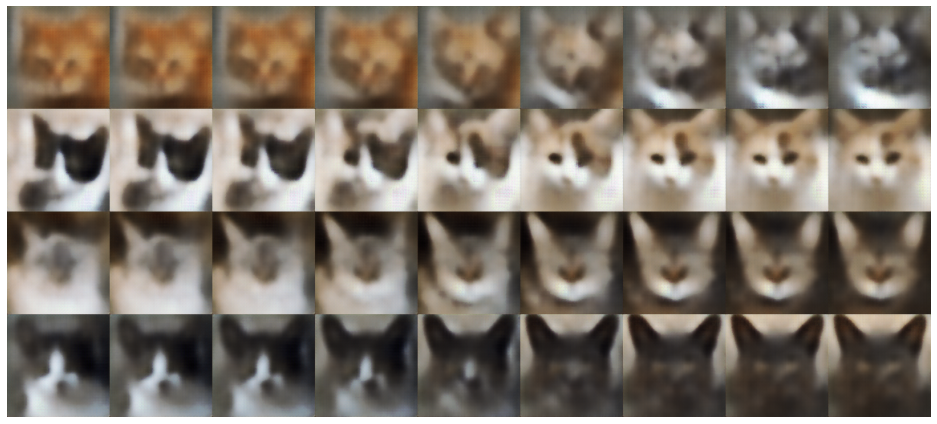

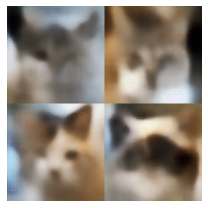

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 81 | Reconstruction loss: 3477.4812920148984 | KLD loss: 1290.6322350790335


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 82 | Reconstruction loss: 3479.2418404039486 | KLD loss: 1292.4060491990674


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 83 | Reconstruction loss: 3469.8952742702277 | KLD loss: 1293.0498304263565


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 84 | Reconstruction loss: 3473.196507842781 | KLD loss: 1294.490922510901


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 85 | Reconstruction loss: 3458.655246184593 | KLD loss: 1294.0246317072433


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 86 | Reconstruction loss: 3453.063078367248 | KLD loss: 1298.0953967190528


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 87 | Reconstruction loss: 3444.5273358012355 | KLD loss: 1295.9314572356468


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 88 | Reconstruction loss: 3425.444686061652 | KLD loss: 1287.9963685501455


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 89 | Reconstruction loss: 3431.4136185047237 | KLD loss: 1294.2101104499757


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 90 | Reconstruction loss: 3420.6994204972143 | KLD loss: 1291.462576648801


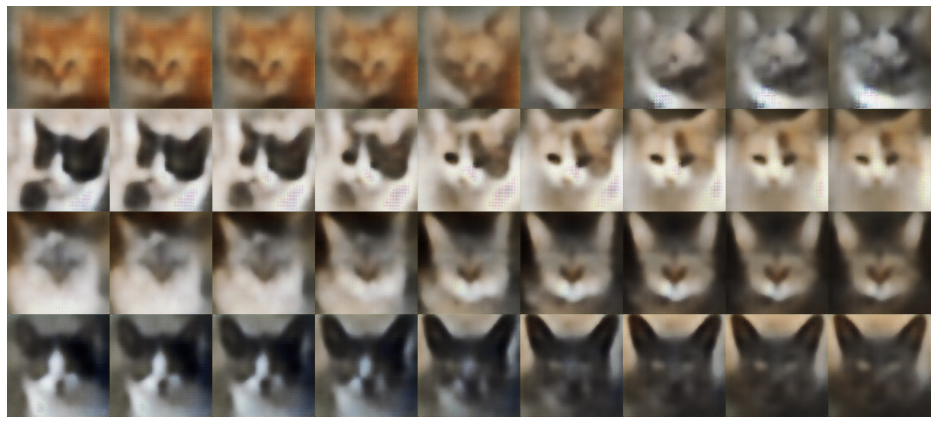

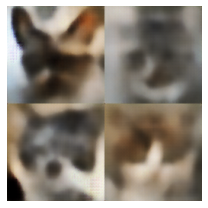

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 91 | Reconstruction loss: 3423.863791106468 | KLD loss: 1291.741513369065


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 92 | Reconstruction loss: 3395.5220320827275 | KLD loss: 1290.775580259811


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 93 | Reconstruction loss: 3387.7331050902376 | KLD loss: 1290.8970954835877


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 94 | Reconstruction loss: 3386.780393804506 | KLD loss: 1285.841184252362


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 95 | Reconstruction loss: 3389.402264640867 | KLD loss: 1290.8357696296632


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 96 | Reconstruction loss: 3374.6564154100047 | KLD loss: 1285.7585148301237


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 97 | Reconstruction loss: 3372.7744174691134 | KLD loss: 1286.8687549206638


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 98 | Reconstruction loss: 3374.218424857679 | KLD loss: 1285.9381226532219


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 99 | Reconstruction loss: 3370.310734995761 | KLD loss: 1288.6465108708817


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 100 | Reconstruction loss: 3348.6796212602953 | KLD loss: 1285.0141688620397


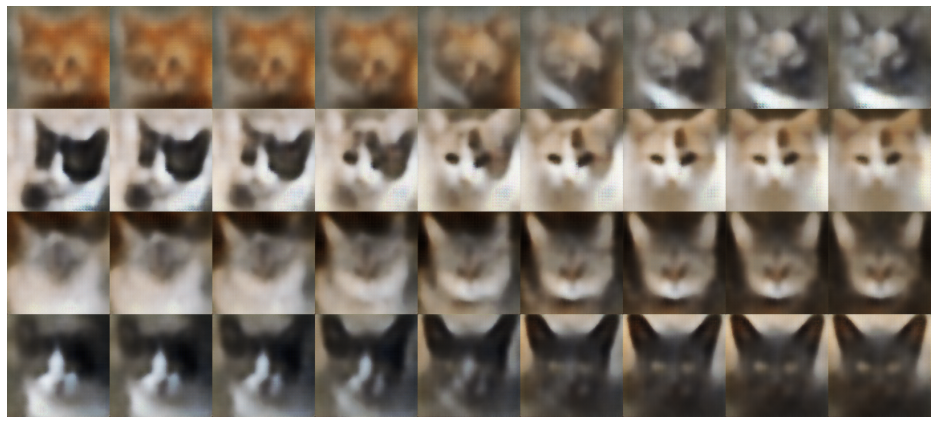

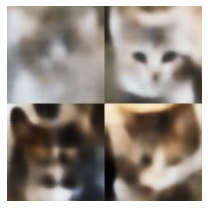

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 101 | Reconstruction loss: 3362.3570694797722 | KLD loss: 1284.099514936107


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 102 | Reconstruction loss: 3339.3253168150436 | KLD loss: 1287.4686156280281


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 103 | Reconstruction loss: 3337.236525140807 | KLD loss: 1286.1822507873062


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 104 | Reconstruction loss: 3339.0638009477957 | KLD loss: 1284.2210640367612


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 105 | Reconstruction loss: 3330.9972126332364 | KLD loss: 1284.3565596233043


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 106 | Reconstruction loss: 3312.18502944828 | KLD loss: 1282.7414208227349


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 107 | Reconstruction loss: 3307.2023781946464 | KLD loss: 1280.2132791681806


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 108 | Reconstruction loss: 3307.2585755813952 | KLD loss: 1281.1014536776283


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 109 | Reconstruction loss: 3294.8581686803536 | KLD loss: 1283.1696277707122


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 110 | Reconstruction loss: 3299.98954567133 | KLD loss: 1283.491385242551


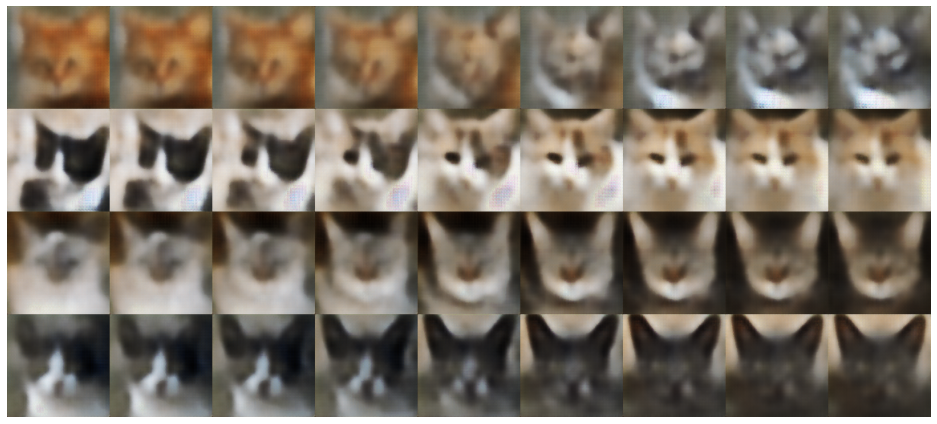

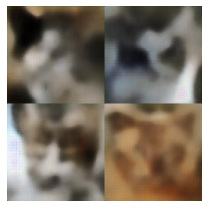

  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 111 | Reconstruction loss: 3294.4287181292393 | KLD loss: 1283.8039300962937


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 112 | Reconstruction loss: 3275.044580645894 | KLD loss: 1281.45661658945


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 113 | Reconstruction loss: 3278.6756056201552 | KLD loss: 1279.331497357982


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 114 | Reconstruction loss: 3272.8627857770107 | KLD loss: 1277.6549776299055


  0%|          | 0/646 [00:00<?, ?it/s]

Epoch 115 | Reconstruction loss: 3274.1349552598112 | KLD loss: 1283.0441835861798


  0%|          | 0/646 [00:00<?, ?it/s]

In [ ]:
def train_vae():
    vae = VAE()
    vae.cuda()

    epochs = 201
    batch_size = 8
    vae_optim = Adam(vae.parameters(), lr=1e-4)

    dataset = CatDataset(size=128)

    test_imgs_1 = torch.cat([dataset[i].unsqueeze(0) for i in (0, 34, 76, 1509)])
    test_imgs_2 = torch.cat([dataset[i].unsqueeze(0) for i in (734, 123, 512, 3634)])

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        rec_loss_avg = 0
        kld_loss_avg = 0

        if ep % 10 == 0:
            with torch.no_grad():
                z_1 = vae.encode(test_imgs_1.cuda())
                z_2 = vae.encode(test_imgs_2.cuda())
                x_int = []
                for i in range(9):
                    z = (i * z_1 + (8 - i) * z_2) / 8
                    x_int.append(vae.decode(z))
                x_int = torch.cat(x_int)
                visualise(x_int, rows=len(test_imgs_1))
                z_rand = torch.randn_like(z_1)
                x_int = vae.decode(z_rand)
                visualise(x_int, rows=len(test_imgs_1)//2)

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            x = batch.cuda()
            x_rec, kld = vae(x)
            img_elems = float(np.prod(list(batch.size())))
            kld_loss = kld.sum() / batch_size
            rec_loss = ((x_rec - x)**2).sum() / batch_size
            loss = rec_loss + 0.1 * kld_loss # https://openreview.net/forum?id=Sy2fzU9gl
            vae_optim.zero_grad()
            loss.backward()
            vae_optim.step()
            kld_loss_avg += kld_loss.item()
            rec_loss_avg += rec_loss.item()

        print(f"Epoch {ep+1} | Reconstruction loss: {rec_loss_avg / total_batches} | KLD loss: {kld_loss_avg / total_batches}")

train_vae()